In [19]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [20]:
import numpy as np

from graph import draw_graph, Node, get_graph, get_edges_from_adjacency_matrix
from data import get_nodes
from edge_discovery import euclidean_distance

In [21]:
nodes, nodes_ids = get_nodes()

In [22]:
adj_matrix = euclidean_distance(nodes, threshold=5, std=3)
print(adj_matrix)

[[0.         0.59071078 0.52163846 0.         0.5763121  0.88376085
  0.         0.        ]
 [0.59071078 0.         0.         0.         0.         0.31469155
  0.         0.        ]
 [0.52163846 0.         0.         0.         0.         0.56025415
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.5763121  0.         0.         0.         0.         0.64577249
  0.         0.        ]
 [0.88376085 0.31469155 0.56025415 0.         0.64577249 0.
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]]


In [23]:
get_edges_from_adjacency_matrix(adj_matrix)

[(4, 5), (0, 1), (0, 2), (2, 5), (0, 4), (0, 5), (1, 5)]

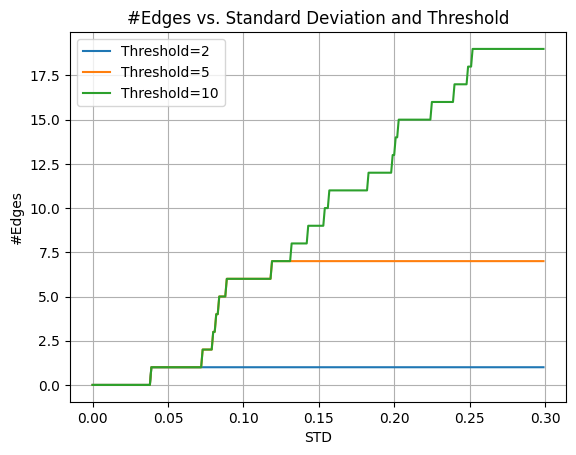

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from graph import draw_graph_in_map
import pandas as pd
import geopandas as gpd
from graph import draw_graph, Node, get_graph, get_edges_from_adjacency_matrix
from edge_discovery import euclidean_distance
from data import get_nodes
from shapely.geometry import Point

thresholds = [2, 5, 10]
std_values = np.arange(0.0, 0.3, 0.001)

# Plotting
for i, threshold in enumerate(thresholds):
    num_edges = []
    for std_val in std_values:
        adj_matrix = euclidean_distance(nodes, threshold=threshold, std=std_val)
        edges = get_edges_from_adjacency_matrix(adj_matrix)
        num_edges.append(np.sum(adj_matrix > 0) // 2)  # Since it's an undirected graph, divide by 2        
    plt.plot(std_values, num_edges, label=f'Threshold={threshold}')

plt.xlabel('STD')
plt.ylabel('#Edges')
plt.title('#Edges vs. Standard Deviation and Threshold')
plt.legend()
plt.grid(True)
plt.savefig('fig/num_edges_distance.png')
plt.show()


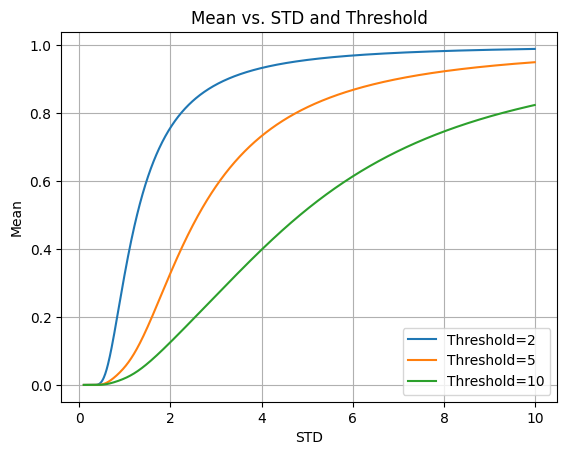

In [29]:
thresholds = [2, 5, 10]
std_values = np.arange(0.1, 10.0, 0.01)

# Plotting
for i, threshold in enumerate(thresholds):
    avgs = []
    for std_val in std_values:
        adj_matrix = euclidean_distance(nodes, threshold=threshold, std=std_val)
        all_weights = adj_matrix.flatten()
        non_zero_weights = all_weights[all_weights != 0]
        avgs.append(np.mean(non_zero_weights))
    plt.plot(std_values, avgs, label=f'Threshold={threshold}')

plt.xlabel('STD')
plt.ylabel('Mean')
plt.title('Mean vs. STD and Threshold')
plt.legend()
plt.grid(True)
plt.savefig('fig/num_edges_distance.png')
plt.show()


In [26]:
from graph import draw_graph_in_map
import pandas as pd
import geopandas as gpd
from graph import draw_graph, Node, get_graph, get_edges_from_adjacency_matrix
from edge_discovery import euclidean_distance
from data import get_nodes
from shapely.geometry import Point
df = pd.read_csv('Node-Location.csv',sep=';')
geometry = [Point(lon, lat) for lon, lat in zip(df['Lon'], df['Lat'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs='EPSG:4326')
nodes, nodes_ids = get_nodes()

2 0.5
[[0.         0.         0.         0.         0.         0.01169638
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.01169638 0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]]
2 3
[[0.         0.         0.         0.         0.         0.88376085
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0. 

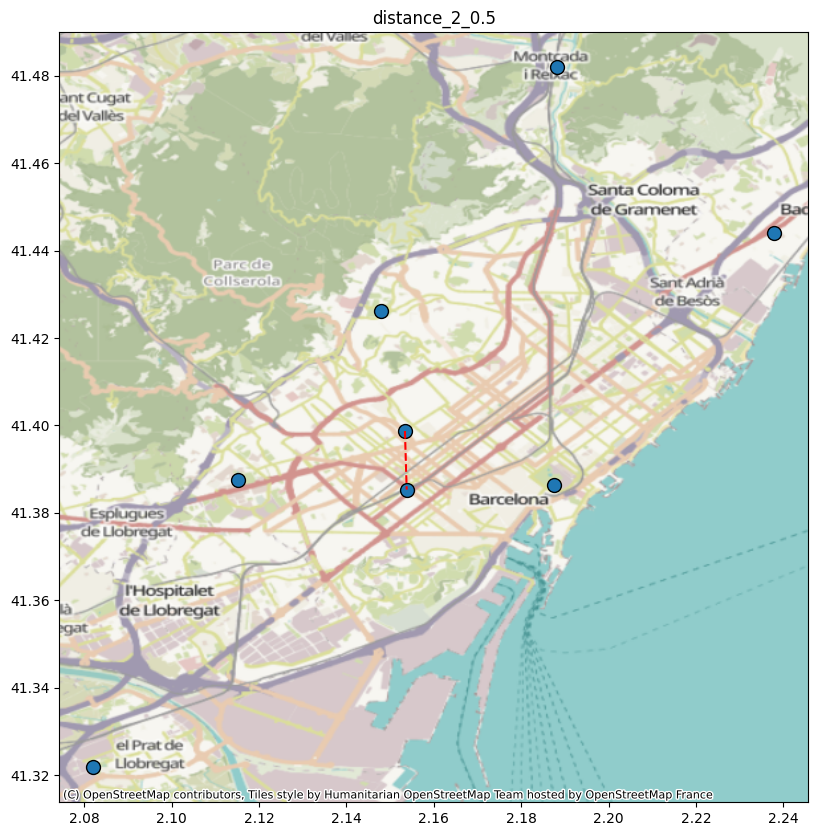

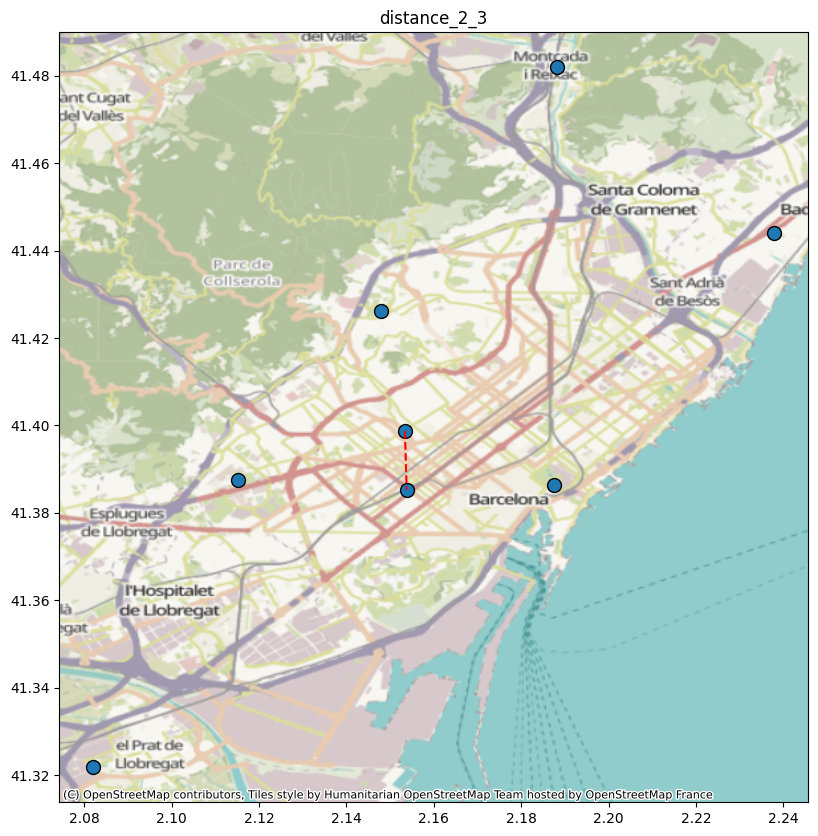

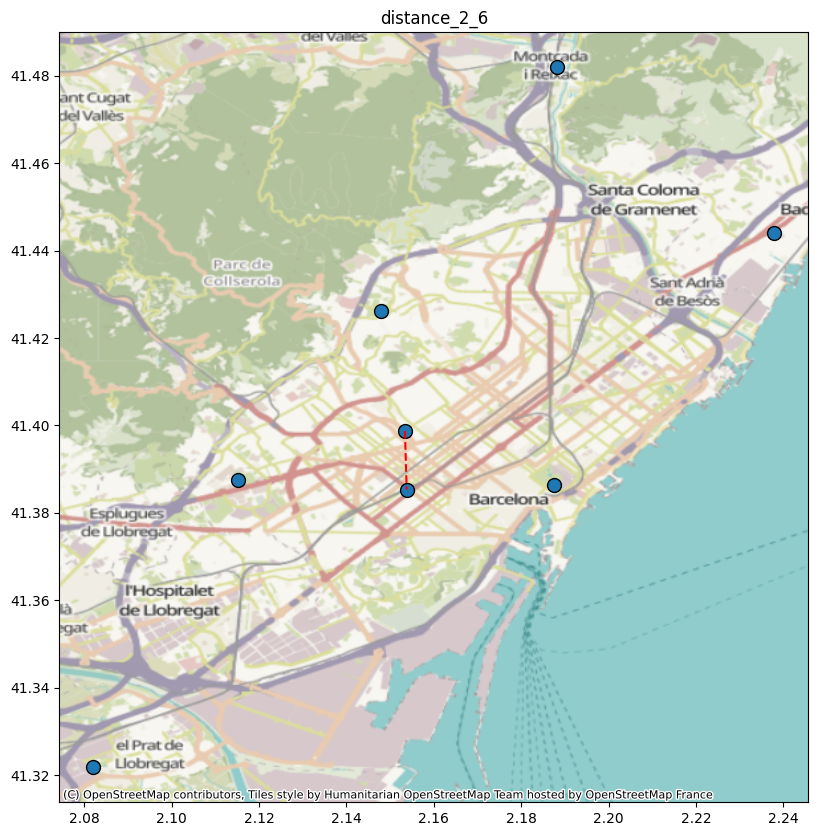

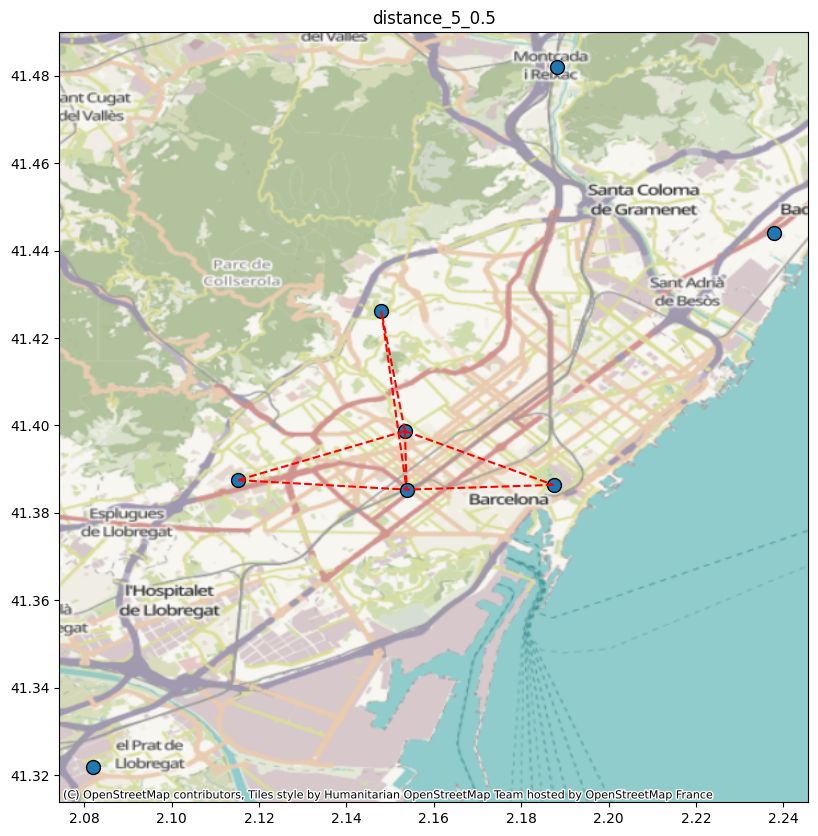

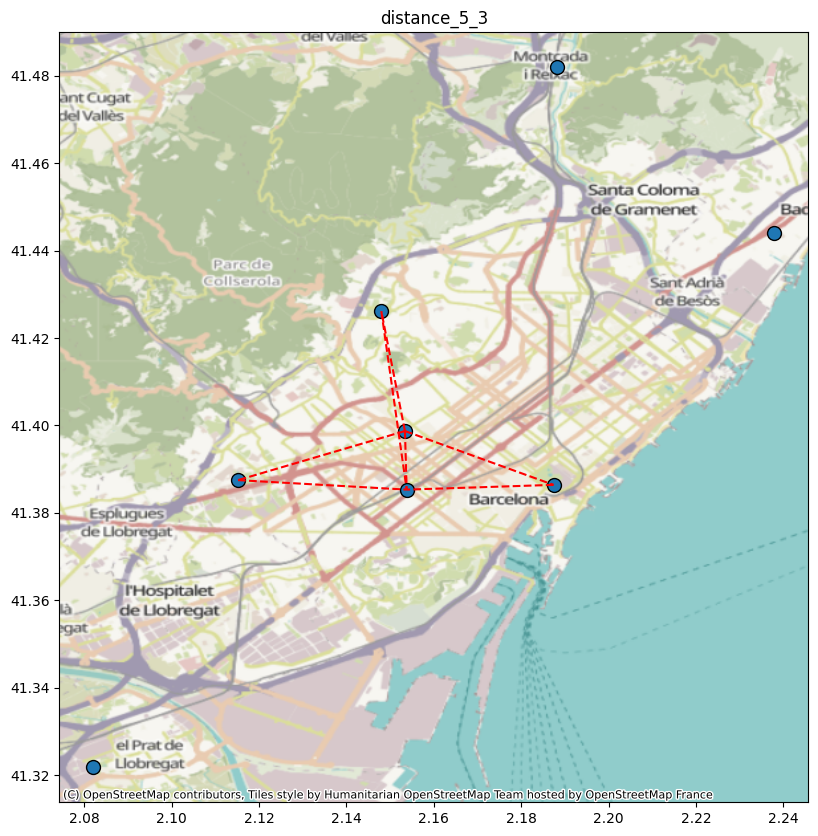

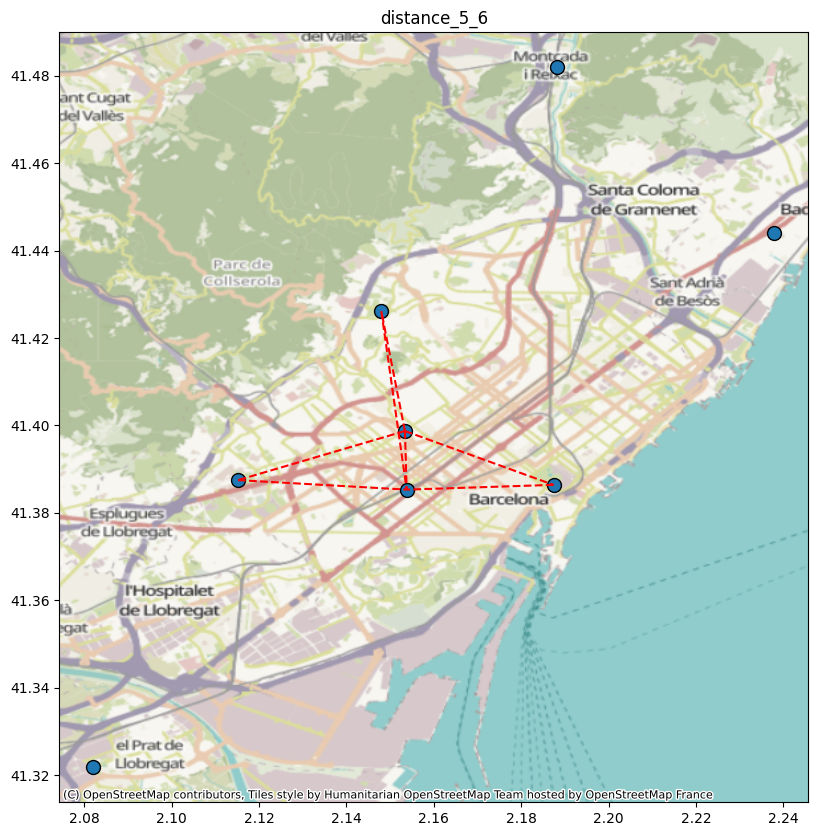

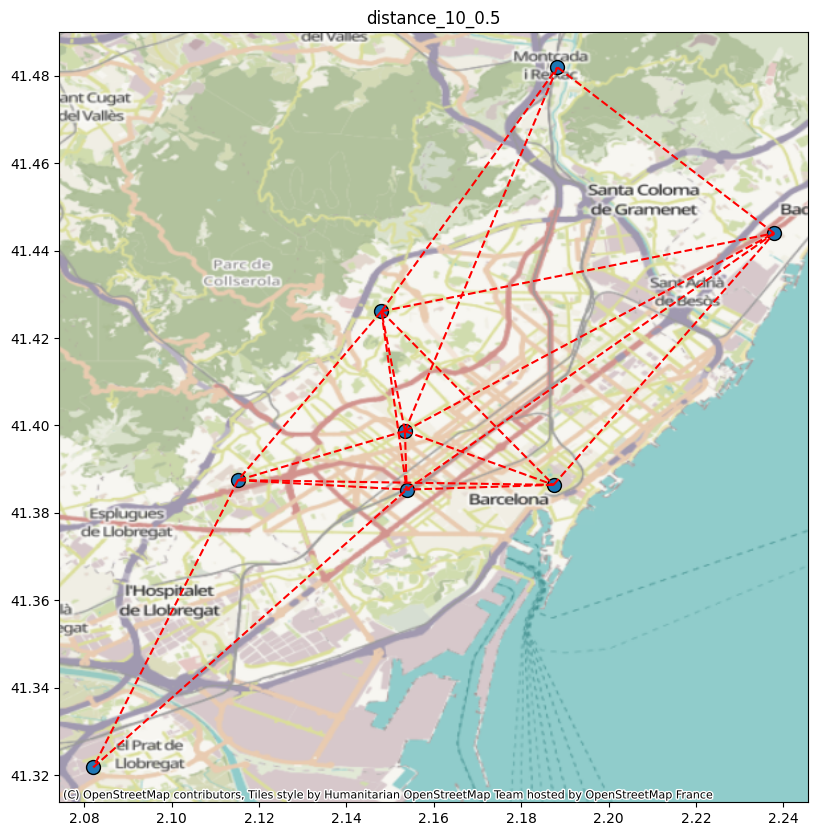

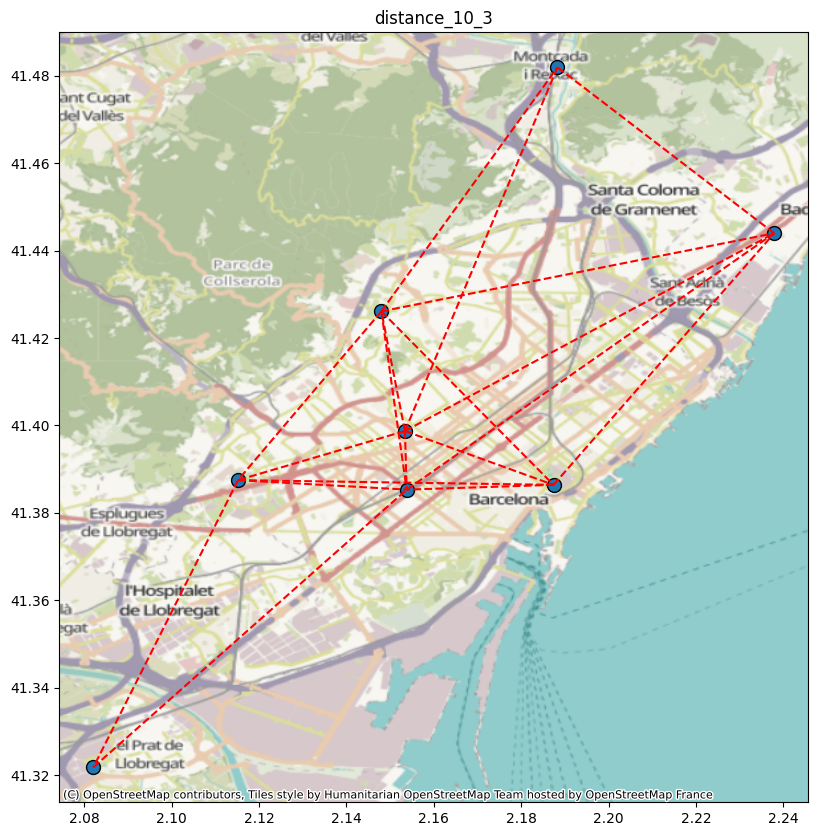

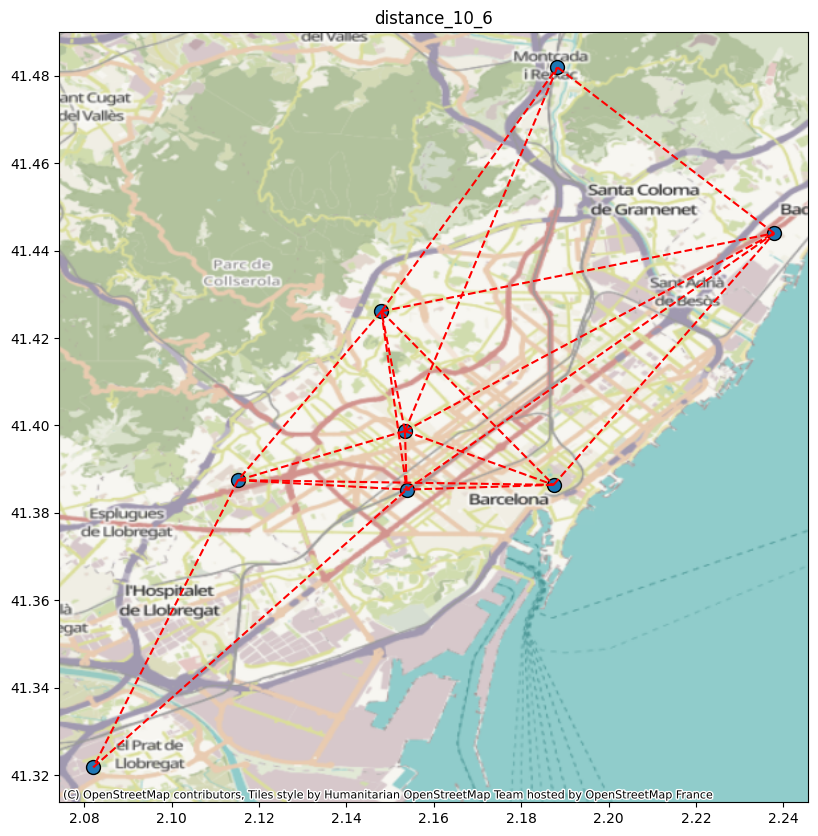

In [27]:
import numpy as np

thresholds = [2, 5, 10]
std_values = [0.5, 3, 6]

# Plotting
for i, threshold in enumerate(thresholds):
    for std in std_values:
        W = euclidean_distance(nodes, threshold, std)
        edges = get_edges_from_adjacency_matrix(W)
        print(threshold, std)
        print(W)
        draw_graph_in_map(gdf, edges, f'distance_{threshold}_{std}')

3 0.5
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 1.16963775e-02 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 1.45500149e-07 0.00000000e+00 0.00000000e+00]
 [1.16963775e-02 0.00000000e+00 0.00000000e+00 0.00000000e+00
  1.45500149e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000

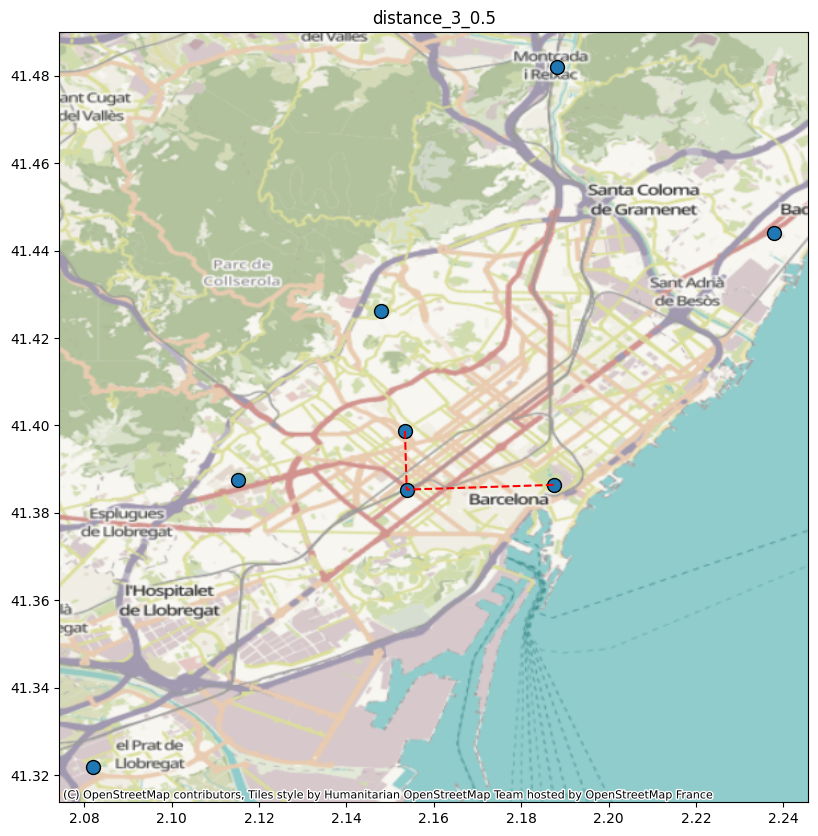

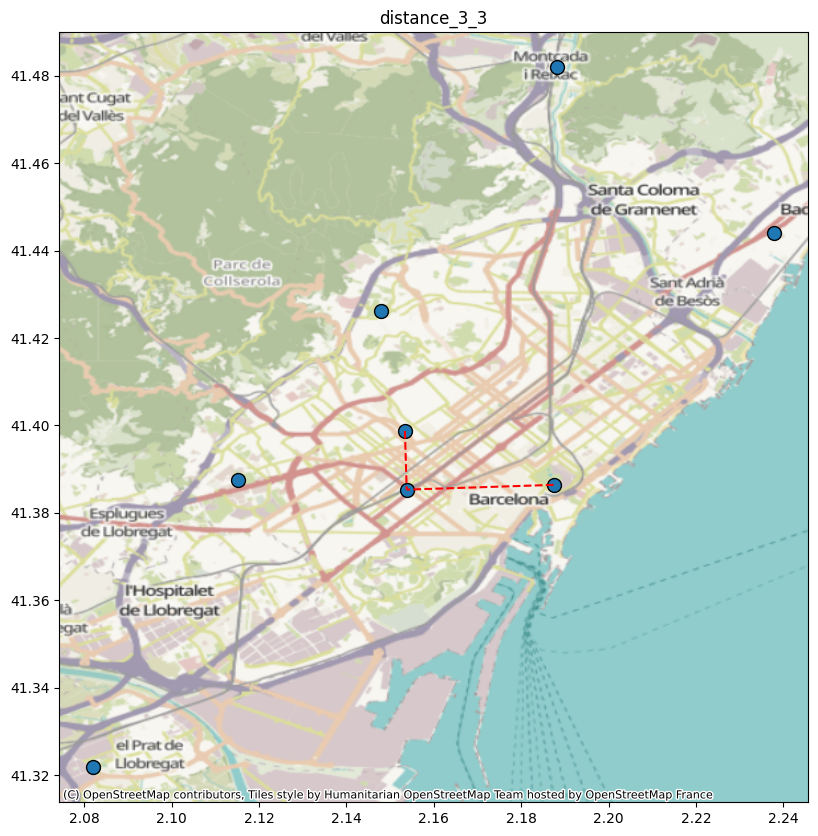

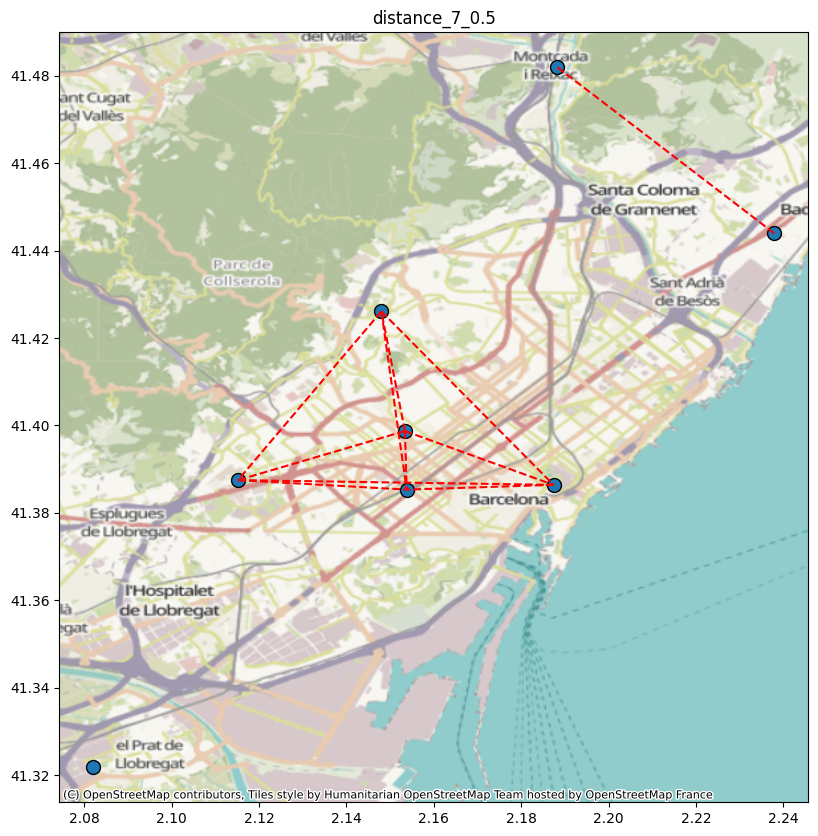

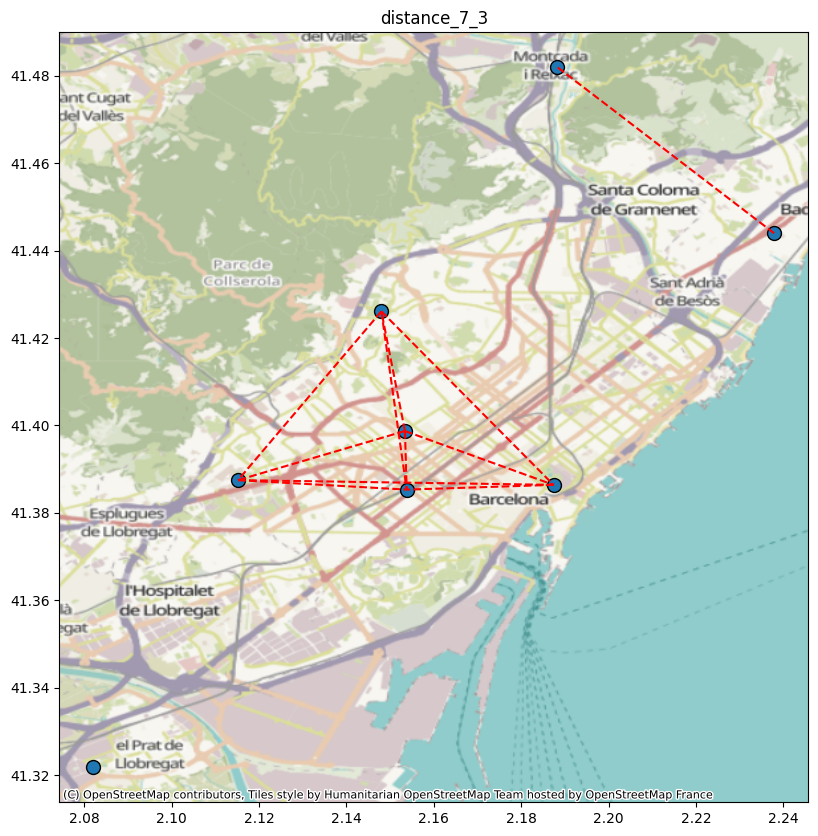

In [34]:
import numpy as np

thresholds = [3,7]
std_values = [0.5, 3]

# Plotting
for i, threshold in enumerate(thresholds):
    for std in std_values:
        W = euclidean_distance(nodes, threshold, std)
        edges = get_edges_from_adjacency_matrix(W)
        print(threshold, std)
        print(W)
        draw_graph_in_map(gdf, edges, f'distance_{threshold}_{std}')